In [1]:
# Install package
%pip install --upgrade git+git://github.com/rahulspsec/portfoliotools.git

  Cloning git://github.com/rahulspsec/portfoliotools.git to /private/var/folders/5g/y08h4ccx7419m412xm4k361c0000gn/T/pip-req-build-918u_4iv
  Running command git clone -q git://github.com/rahulspsec/portfoliotools.git /private/var/folders/5g/y08h4ccx7419m412xm4k361c0000gn/T/pip-req-build-918u_4iv
  Found existing installation: portfoliotools 0.0.1
    Uninstalling portfoliotools-0.0.1:
      Successfully uninstalled portfoliotools-0.0.1
  Running setup.py install for portfoliotools ... done
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
from portfoliotools.screener.stock_screener import StockScreener
from portfoliotools.screener.utility.util import get_ticker_list, getHistoricStockPrices, get_nse_index_list, get_port_ret_vol_sr
from portfoliotools.screener.stock_screener import PortfolioStrategy, ADF_Reg_Model
from tqdm import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

#### Select list of stocks

In [3]:
tickers = get_ticker_list()
stock_list = [ticker['Ticker'] for ticker in tickers]
stock_list.remove("GAIL")
calc_screener = False
#stock_list = ['ICICIBANK', 'HDFC', 'HDFCBANK', 'INFY', 'RELIANCE', 'ASIANPAINT', 'TCS', 'MARUTI', 'TATAMOTORS', 'CIPLA']
#stock_list = ['INFY', 'SBIN', 'HDFC', 'HDFCBANK', 'NATIONALUM']


cob = datetime(2020,2,1) # COB Date

### <font color = 'red'>Screener Results</font>

In [4]:
if calc_screener:
    result = None
    for stock in tqdm(stock_list):
        obj = StockScreener(stock_list= [stock], cob=cob)
        temp_result = obj.get_summary()
        if result is None: result = temp_result
        else: result = result.append(temp_result)

    result.index = result['Stock Name']
    result.drop('Stock Name', inplace = True, axis = 1)
    result = result.transpose() 
    result

### <font color = 'red'>Portfolio Strategy Tools</font>

### <font color = 'blue'>Stocks</font>

In [5]:
asset_list = stock_list

In [6]:
strat = PortfolioStrategy(asset_list, period = 1000, cob = cob)

#### Correlation Matrix

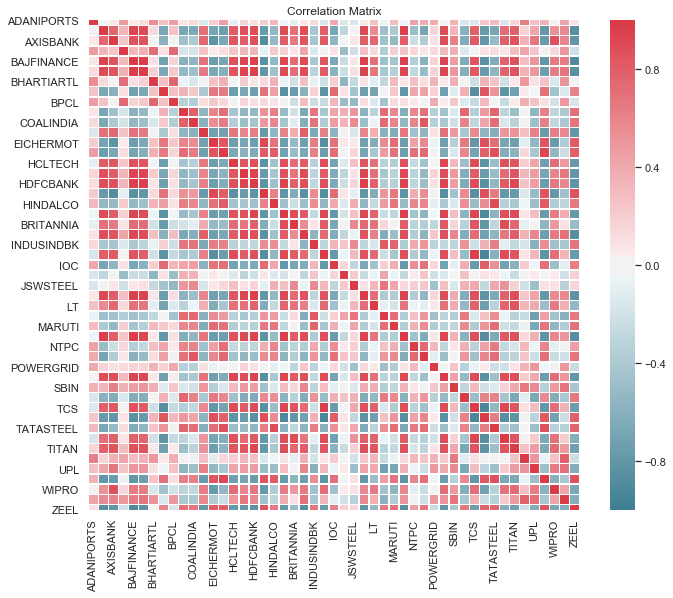

In [7]:
fig = strat.plot_correlation_matrix()
fig.show()

#### Correlated Stocks

In [8]:
corr_pair = strat.get_correlation_pair()
print("Highly Correlated:")
display_html(corr_pair[corr_pair['Correlation'] > .95])
print("\nInversely Correlated:")
display_html(corr_pair[corr_pair['Correlation'] < -.90])

Highly Correlated:


,Stock 1,Stock 2,Correlation
0,BAJFINANCE,BAJAJFINSV,0.980477
1,BAJFINANCE,HDFCBANK,0.968233
2,INFY,TCS,0.967781
3,HDFCBANK,KOTAKBANK,0.967714
4,HINDUNILVR,NESTLEIND,0.965762
5,BAJFINANCE,NESTLEIND,0.964221
6,BAJAJFINSV,HDFCBANK,0.963975
7,BAJFINANCE,KOTAKBANK,0.959957
8,ASIANPAINT,NESTLEIND,0.958551



Inversely Correlated:


,Stock 1,Stock 2,Correlation
1172,BAJFINANCE,ZEEL,-0.901503
1173,HINDUNILVR,TATAMOTORS,-0.914762
1174,TCS,TATAMOTORS,-0.937481
1175,INFY,TATAMOTORS,-0.943178


#### <font color = 'red'>Efficient Frontier</font>

In [9]:
market_portfolio = strat.get_efficient_market_portfolio(plot = True, num_ports = 50000, show_frontier =True) #plot =True to plot Frontier

#### Market Portfolio

,MP
BAJFINANCE (%),11.5300
HDFCBANK (%),2.5900
HINDUNILVR (%),18.0200
ICICIBANK (%),4.1100
INFY (%),8.3600
KOTAKBANK (%),3.9500
NESTLEIND (%),15.8800
RELIANCE (%),9.0600
TCS (%),14.7300
TECHM (%),5.8800


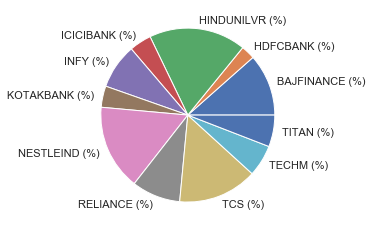

In [10]:
market_portfolio = market_portfolio.T
market_portfolio = market_portfolio[market_portfolio['MP'] != 0.00]
plt.pie(market_portfolio.iloc[:-3,0], labels=market_portfolio.index.tolist()[:-3])
market_portfolio

**Ticker Details**

In [11]:
strat.get_details()

,Name,Return,Risk,Sharpe
0,ADANIPORTS,0.033766,0.308436,0.109474
1,ASIANPAINT,0.169050,0.216154,0.782083
2,AXISBANK,0.136971,0.276292,0.495746
3,BAJAJ-AUTO,0.063438,0.226703,0.279831
4,BAJFINANCE,0.463351,0.326024,1.421217
5,BAJAJFINSV,0.284075,0.292572,0.970957
6,BHARTIARTL,0.170926,0.338542,0.504888
7,INFRATEL,-0.091255,0.363108,-0.251315
8,BPCL,0.034168,0.376387,0.090778
9,CIPLA,-0.073364,0.250385,-0.293005


### <font color = 'blue'>Index</font>

In [12]:
#get_nse_index_list()

In [13]:
index_list_sector = ['NIFTY BANK', 'NIFTY PHARMA', 'NIFTY FMCG',
             'NIFTY IT','NIFTY AUTO', 'NIFTY MEDIA', 'NIFTY METAL']
index_list_market_cap = ['NIFTY 50', 'NIFTY MIDCAP 50', 'NIFTY SMLCAP 100']
index_list = index_list_sector#index_list_market_cap

In [14]:
strat = PortfolioStrategy(index_list, period = 1000, cob = cob)

**Correlation Matrix**

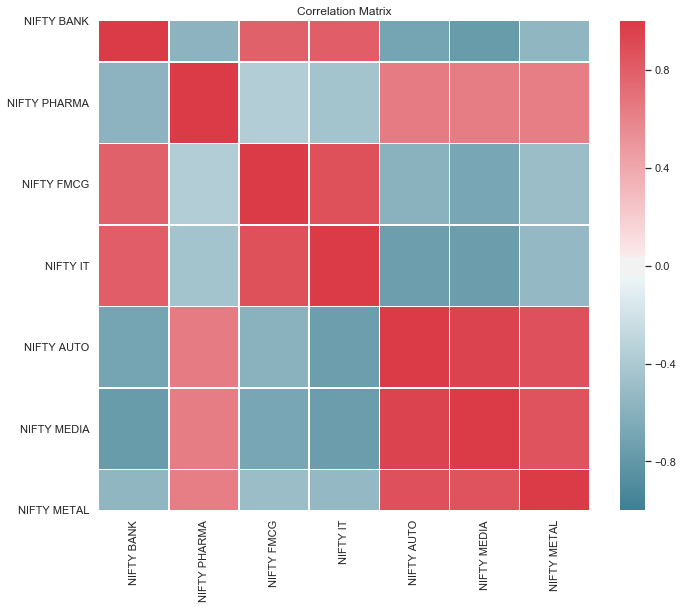

In [15]:
fig = strat.plot_correlation_matrix()
fig.show()

**Highly Correlated**

In [16]:
corr_pair = strat.get_correlation_pair()
print("Highly Correlated:")
display_html(corr_pair[corr_pair['Correlation'] > .90])
print("\nInversely Correlated:")
display_html(corr_pair[corr_pair['Correlation'] < -.70])

Highly Correlated:


,Stock 1,Stock 2,Correlation
0,NIFTY AUTO,NIFTY MEDIA,0.951994



Inversely Correlated:


,Stock 1,Stock 2,Correlation
18,NIFTY IT,NIFTY AUTO,-0.743496
19,NIFTY IT,NIFTY MEDIA,-0.755882
20,NIFTY BANK,NIFTY MEDIA,-0.765420


#### <font color = 'red'>Efficient Frontier</font>

In [17]:
market_portfolio = strat.get_efficient_market_portfolio(plot = True, num_ports = 50000, show_frontier =False) #plot =True to plot Frontier

#### Market Portfolio (Index)

,MP
NIFTY BANK (%),21.3000
NIFTY FMCG (%),20.0700
NIFTY IT (%),58.6300
Return,0.1420
Risk,0.1171
Sharpe,1.2120


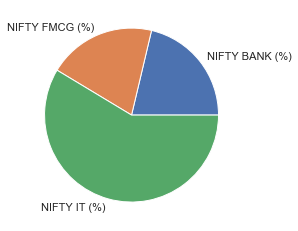

In [18]:
market_portfolio = market_portfolio.T
market_portfolio = market_portfolio[market_portfolio['MP'] != 0.00]
plt.pie(market_portfolio.iloc[:-3,0], labels=market_portfolio.index.tolist()[:-3])
market_portfolio

#### Return, Risk, Sharpe (Individual)

In [19]:
strat.get_details()

,Name,Return,Risk,Sharpe
0,NIFTY BANK,0.100310,0.165468,0.606221
1,NIFTY PHARMA,-0.083082,0.199772,-0.415881
2,NIFTY FMCG,0.094107,0.146615,0.641868
3,NIFTY IT,0.173507,0.162921,1.064973
4,NIFTY AUTO,-0.094699,0.195738,-0.483805
5,NIFTY MEDIA,-0.213656,0.261372,-0.817440
6,NIFTY METAL,-0.052171,0.245644,-0.212383


#### Screener Details

In [20]:
strat.get_screener_details()

ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error calculating ATR Results - NIFTY BANK
ERROR:root:Error calculating Renko Results - NIFTY BANK
ERROR:root:'EBITDA'
ERROR:root:Error calculating derived info NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 wee

,Stock Name,Date,Last Close,Last COB,Average Volume,Standard Deviation,CAGR,Annual Volatility,Sharpe,Sortino,52W High,52W Low,Price% 52 Week,Price per Range,Return 1D,Return 1W,Return 1M,Return 1Y,Smoothing Period,Lookback Period,%R,%D,WilliamR Signal,30D Moving Average,60D Moving Average,200D Moving Average,12D Exponential Moving Average,26D Exponential Moving Average,MACD Line,MACD Indicator,MACD Line to Indicator Diff (Value),MACD Line to Indicator Diff (Days),MACD Line to Indicator Diff Rolling Peak,MACD Line to Indicator Diff Rolling Peak per,MACD Signal,Bollinger Band Upper,Bollinger Band Middle,Bollinger Band Lower,RSI Value,RSI Signal,ATR Value,ADX Value,OBV Value,OBV Index,OBV Slope,OBV Signal,Slope Value,Renko Trend,Renko Strength,Renko Signal,Renko Date,EarningYield,FCFYield,ROC,BookToMkt,DivYield,Sector
0,NIFTY BANK,01Feb20,29820.90,01Feb20,2.471896e+08,452.24,8.94,18.18,0.299,0.515,-999,-999,1.797693e+308,100 %,-3.28,-3.30,-8.08,8.62,5,6,-95.39,-78.03,,31554.49,31549.66,30088.23,30859.63,31211.32,-351.69,-236.82,-114.87,-28,182.85,-62.82,,31371.31,30562.52,29753.72,21.33,BUY,514.43,47.00,7.617625e+09,30.82,0.94,,-89.70,,-999,,,-999,-999,-999,-999,-999,
1,NIFTY PHARMA,01Feb20,8013.75,01Feb20,2.295574e+07,183.03,-6.90,19.57,-0.532,-0.842,-999,-999,1.797693e+308,100 %,-1.53,-4.78,-0.50,-9.98,5,6,-92.95,-68.55,,8152.74,8077.34,8134.27,8225.29,8185.45,39.85,73.14,-33.29,-2,33.29,-100.00,,8543.01,8198.52,7854.03,22.48,BUY,186.89,44.44,-2.082734e+08,-9.07,-43.72,BUY,-89.47,,-999,,,-999,-999,-999,-999,-999,
2,NIFTY FMCG,01Feb20,30196.65,01Feb20,2.669341e+07,413.17,5.53,14.25,0.142,0.234,-999,-999,1.797693e+308,100 %,-1.88,-3.06,-0.23,-1.83,5,6,-87.90,-76.47,,30645.80,30733.69,30140.43,30911.96,30831.16,80.80,203.62,-122.81,-3,143.85,-85.37,,31635.89,30804.05,29972.22,25.85,BUY,526.98,29.17,5.819683e+08,21.80,-46.98,,-89.75,,-999,,,-999,-999,-999,-999,-999,
3,NIFTY IT,01Feb20,16282.65,01Feb20,3.266271e+07,236.58,13.34,17.33,0.568,0.827,-999,-999,1.797693e+308,100 %,0.86,-0.68,3.65,13.81,5,6,-48.45,-54.29,,16097.83,15671.77,15704.40,16297.31,16142.56,154.76,203.41,-48.65,-6,48.65,-100.00,,16549.21,16309.09,16068.98,47.99,,203.14,38.17,9.931909e+08,30.41,-8.70,,-89.09,,-999,,,-999,-999,-999,-999,-999,
4,NIFTY AUTO,01Feb20,7880.30,01Feb20,7.063264e+07,166.12,-17.48,21.78,-0.963,-1.560,-999,-999,1.797693e+308,100 %,-2.55,-4.58,-4.68,-11.08,5,8,-90.83,-84.72,,8199.80,8125.26,7861.49,8156.68,8172.96,-16.28,31.76,-48.05,-8,48.05,-100.00,,8382.38,8123.58,7864.78,25.48,BUY,166.22,28.35,-2.755992e+08,-3.90,-44.28,BUY,-89.16,,-999,,,-999,-999,-999,-999,-999,
5,NIFTY MEDIA,01Feb20,1755.90,01Feb20,4.368342e+07,67.00,-29.52,28.99,-1.139,-1.454,-999,-999,1.797693e+308,100 %,-4.33,-6.72,-2.49,-29.66,5,8,-96.47,-75.39,,1817.64,1819.27,1951.35,1837.56,1829.13,8.43,20.83,-12.40,-3,17.96,-69.02,,1918.88,1833.85,1748.81,28.77,BUY,40.26,29.00,6.708199e+07,1.54,-23.58,BUY,-87.64,,-999,,,-999,-999,-999,-999,-999,
6,NIFTY METAL,01Feb20,2480.55,01Feb20,9.724964e+07,71.94,-21.85,25.77,-0.984,-1.600,-999,-999,1.797693e+308,100 %,-3.44,-8.46,-13.57,-16.51,5,8,-94.09,-92.96,,2770.25,2675.51,2676.12,2675.37,2716.91,-41.54,5.75,-47.29,-11,47.29,-100.00,,2842.05,2635.42,2428.79,17.38,BUY,71.27,44.54,-1.207083e+09,-12.41,-39.61,,-88.64,,-999,,,-999,-999,-999,-999,-999,
